# Визуализация данных

In [1]:
import os
import json

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

### Задание 1.1. Загрузка данных
1. Загрузи ответы респондентов, обработанные в предыдущем проекте, из файла 
[kaggle_survey_2025_responses.csv](datasets/kaggle_survey_2025_responses.csv) в переменную `responses`
2. Загрузи словарь с расшифровкой вопросов из файла [name2question.json](datasets/name2question.json) в переменную `name2question`
3. Выведи размерность DataFrame `responses` и длину словаря `name2question`
4. Убедись, что проверки с помощью `assert` проходят без ошибок и данные загружены корректно

In [2]:
responses = pd.read_csv(
    "../assets/project4/kaggle_survey_2025_responses.csv",
    low_memory=False,
)

In [3]:
with open("../assets/project4/name2question.json") as fin:
    name2question = json.load(fin)

In [4]:
assert responses.shape[0] == 18696

In [5]:
assert responses.shape[1] == len(name2question) == 394

### Задание 1.2. Круговая диаграмма
1. Используя библиотеку `matplotlib`, построй круговую диаграмму (*Pie Chart*), отображающую распределение респондентов по возрастным категориям.
2. С помощью параметра `explode` выдели сектор с наибольшей долей.
3. Объедини категории, доля которых составляет менее 5% от общего числа респондентов, в одну группу под названием `"Other"`.
4. Отсортируй категории по возрастанию возраста.
5. Добавь к диаграмме легенду и информативный заголовок.

In [6]:
os.makedirs("../assets/project4/images", exist_ok=True)

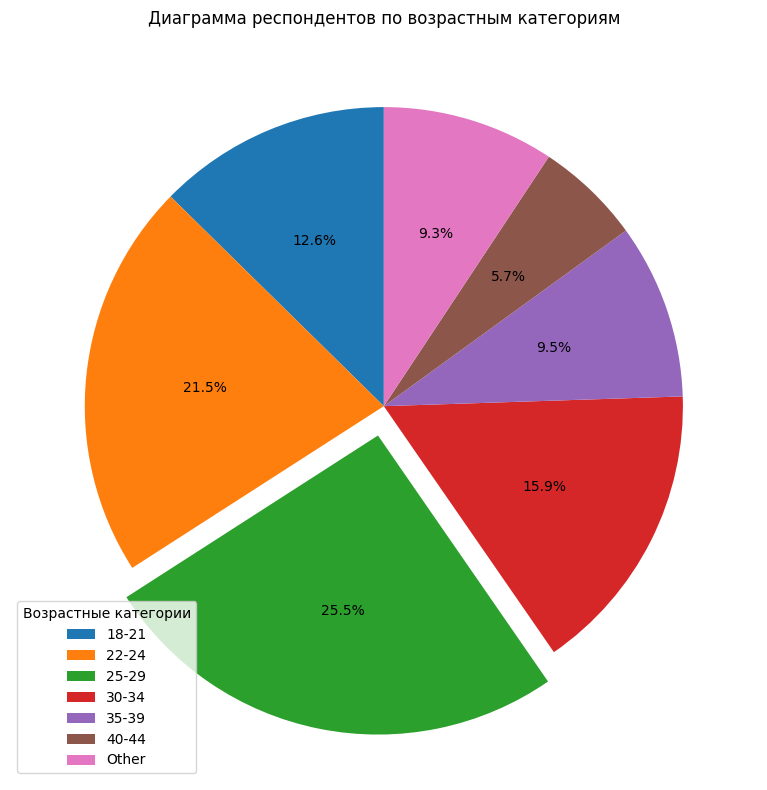

In [7]:
age_counts = responses["Q2"].value_counts()

# Преобразуем в проценты
total = age_counts.sum()
shares = age_counts / total

# Объединяем категории с долей < 5% в "Other"
merged = age_counts[shares >= 0.05].copy()
other_total = age_counts[shares < 0.05].sum()
if other_total > 0:
    merged["Other"] = other_total

# Подготовка данных для построения
merged = merged.sort_index()
labels = merged.index
sizes = merged.values

# Выделяем сектор с наибольшей долей
explode = [0.1 if size == max(sizes) else 0 for size in sizes]

# Строим круговую диаграмму
fig, ax = plt.subplots(figsize=(12, 8))
wedges, texts, autotexts = ax.pie(
    sizes,
    explode=explode,
    # labels=labels,
    autopct="%1.1f%%",
    startangle=90,
    # shadow=True
)

ax.legend(wedges, labels, title="Возрастные категории", loc=3)
ax.set_title("Диаграмма респондентов по возрастным категориям")

plt.tight_layout()
plt.savefig("../assets/project4/images/task_2.png", dpi=300, bbox_inches="tight")
plt.show()

### Задание 1.3. Столбцовая диаграмма
1. С помощью библиотеки `seaborn` построй столбцовую диаграмму (*Bar Plot*), отражающую популярность библиотек для визуализации данных.
2. Отфильтруй данные, оставив только ответы, относящиеся к библиотекам для визуализации данных.
3. Исключи из анализа категории с частотой встречаемости менее **500 наблюдений**.
4. Отсортируй библиотеки по убыванию популярности.
5. Используй горизонтальную ориентацию столбцов.
6. Применяй цветовую палитру `'colorblind'`.
7. Добавь информативный заголовок и поверни подписи на оси X на 30 градусов.

In [8]:
columns = responses.columns 
q_21_columns = columns[columns.str.startswith("Q21")]

In [9]:
responses["Q21_Part_13"].value_counts()

Q21_Part_13
Other    474
Name: count, dtype: int64

In [10]:
q_21_columns

Index(['Q21_Part_1', 'Q21_Part_2', 'Q21_Part_3', 'Q21_Part_4', 'Q21_Part_5',
       'Q21_Part_6', 'Q21_Part_7', 'Q21_Part_8', 'Q21_Part_9', 'Q21_Part_10',
       'Q21_Part_11', 'Q21_Part_12', 'Q21_Part_13', 'Q21_OTHER_TEXT'],
      dtype='object')

In [11]:
all_libs = pd.concat([responses[col] for col in q_21_columns], ignore_index=True)
all_libs = all_libs.dropna().astype(str).str.strip().str.lower()
all_libs = all_libs[
    ~(all_libs.str.isnumeric()) &
    (all_libs != "other") &
    (all_libs != "-1") &
    (all_libs != "-2") &
    True
]
lib_counts = all_libs.value_counts()
lib_counts = lib_counts[lib_counts >= 500]
lib_counts = lib_counts.sort_values(ascending=False)

In [12]:
lib_counts

matplotlib    11175
seaborn        6464
ggplot2        6460
plotly         4636
shiny          2167
d3             1837
bokeh          1585
leaflet         827
lattice         724
geoplotlib      643
Name: count, dtype: int64

/var/folders/07/935mwg8x6bl2x3z6x_7wc7kc0000gn/T/ipykernel_49618/1570194204.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


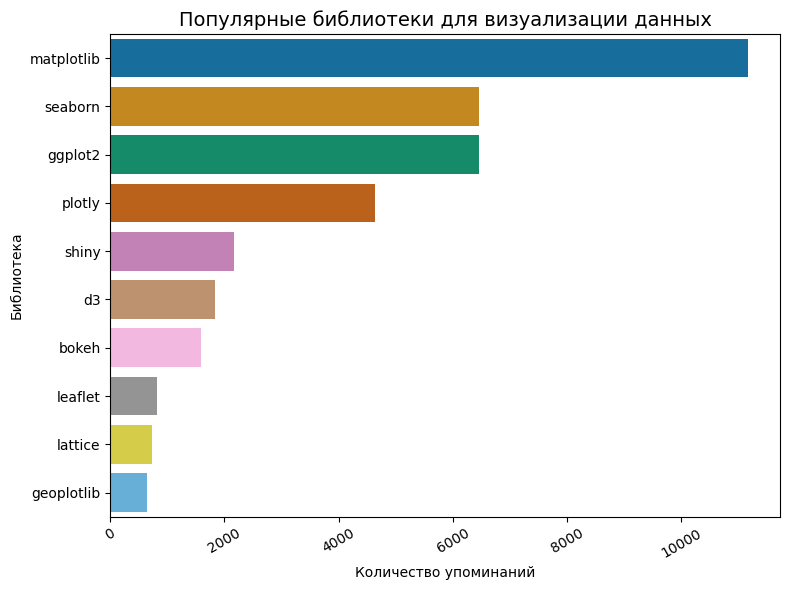

In [13]:
plt.figure(figsize=(8, 6))

sns.barplot(
    x=lib_counts.values,
    y=lib_counts.index,
    orient='h',
    palette='colorblind'
)
# 8️⃣ Добавим заголовок и оформление
plt.title('Популярные библиотеки для визуализации данных', fontsize=14)
plt.xlabel('Количество упоминаний')
plt.ylabel('Библиотека')
plt.xticks(rotation=30)

plt.tight_layout()
plt.savefig("../assets/project4/images/task_3.png", dpi=300, bbox_inches="tight")
plt.show();

### Задание 1.4. Диаграмма "ящик с усами"
1. С помощью библиотеки `seaborn` построй диаграмму **"ящик с усами" (box plot)**, отображающую распределение заработка по различным специальностям
2. Исключи из анализа категории **студентов** и **неработающих**
3. Отобрази по оси **Y** — должности, по оси **X** — заработок в год
4. Отсортируй специальности **по убыванию медианного значения заработка**
5. Ограничь диапазон оси **X** значением **до 500 000 $** в год
6. Установи **шаг сетки по оси X** равным **50 000**
7. Используй цветовую палитру `'colorblind'`
8. Добавь **заголовок** и **подписи осей**

In [14]:
def get_mean(row):
    mapper = {
        "I do not wish to disclose my approximate yearly compensation": np.nan,
        "0-10000": 5000,
        "10-20000": 15000,
        "20-30000": 25000,
        "30-40000": 35000,
        "40-50000": 45000,
        "50-60000": 55000,
        "60-70000": 65000,
        "70-80000": 75000, 
        "80-90000": 85000, 
        "90-100000": 95000,
        "100-125000": 112500,
        "125-150000": 137500,
        "150-200000": 175000,
        "200-250000": 225000,
        "250-300000": 275000,
        "300-400000": 350000,
        "400-500000": 450000,
        "500000+": 500000,
        np.nan: np.nan,
    }
    return mapper[row]

In [15]:
responses["Q9_new"] = responses["Q9"].str.replace(",", "", regex=True).apply(func=get_mean)

In [16]:
my_order = responses[
                ~responses["Q6"].isin(["Not employed", "Student"])
            ].groupby(by=["Q6"])["Q9_new"].median().sort_values(ascending=False).index

In [17]:
my_order

Index(['Chief Officer', 'Principal Investigator', 'Manager', 'Consultant',
       'Product/Project Manager', 'Data Scientist', 'Research Scientist',
       'Data Engineer', 'Other', 'Salesperson', 'Business Analyst',
       'Marketing Analyst', 'Developer Advocate', 'Statistician',
       'DBA/Database Engineer', 'Data Analyst', 'Software Engineer',
       'Data Journalist', 'Research Assistant'],
      dtype='object', name='Q6')

/var/folders/07/935mwg8x6bl2x3z6x_7wc7kc0000gn/T/ipykernel_49618/2769594279.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y="Q6", x="Q9_new",


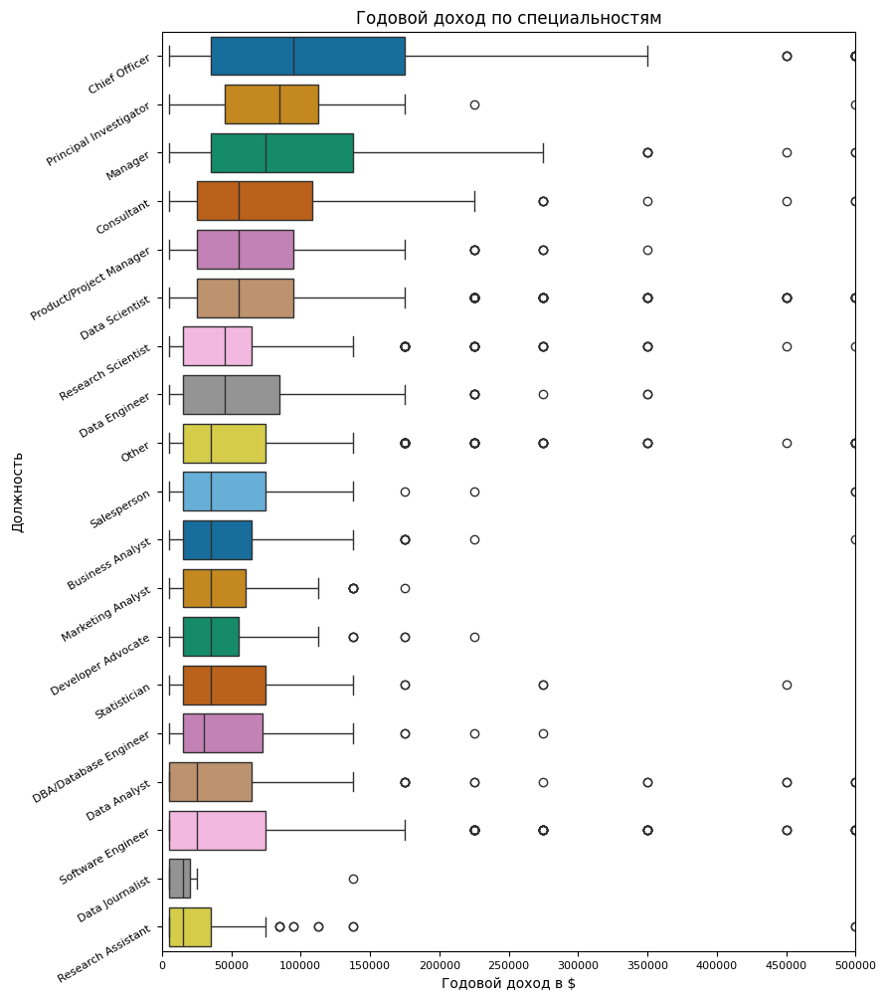

In [18]:
fig, ax = plt.subplots(figsize=(9, 12))
sns.boxplot(y="Q6", x="Q9_new",
            data=responses[
                ~responses["Q6"].isin(["Not employed", "Student"])
            ], 
            linewidth=1,
            palette="colorblind",
            order=my_order,
            legend=False,
           )
plt.ylabel("Должность")
plt.yticks(fontsize=8, rotation=30)
plt.xticks(np.arange(0, max(responses['Q9_new'].dropna())+1, 50000), fontsize=8)
plt.xlim(0, 500000)
plt.xlabel("Годовой доход в $")
plt.title("Годовой доход по специальностям",)
plt.savefig("../assets/project4/images/task_4.png", dpi=300, bbox_inches="tight")
plt.show();

### Задание 1.5. Географическая карта респондентов
1. С помощью библиотеки `plotly` построй **интерактивную карту мира**, отображающую количество респондентов из каждой страны
2. Для визуализации используй тип **choropleth map** (тепловая карта по регионам)
3. Закрась страны в зависимости от числа респондентов: чем больше значение, тем насыщеннее цвет
4. Применяй цветовую шкалу `'Viridis'` для повышения читаемости
5. Добавь **заголовок**, **легенду** и **подпись шкалы**, поясняющую интенсивность окрашивания
6. Сделай карту интерактивной: при наведении курсора должны отображаться **названия стран** и **количество респондентов**

In [19]:
import plotly.express as px

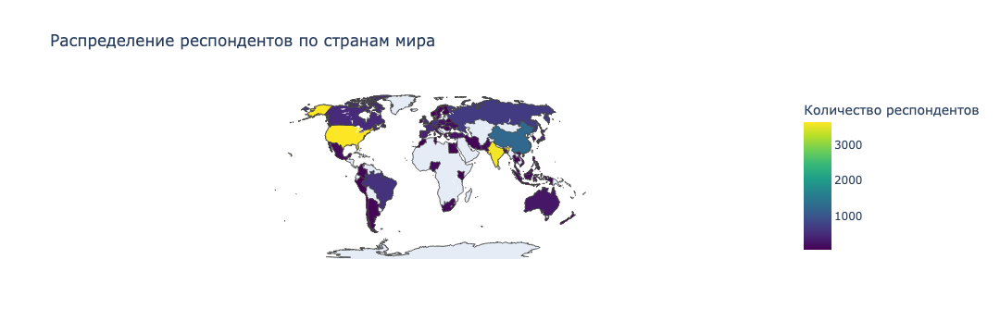

In [20]:
country_counts = responses["Q3"].value_counts().reset_index()
country_counts.columns = ["Country", "Respondents"]

fig = px.choropleth(
    country_counts,
    locations="Country",      
    locationmode="country names",      
    color="Respondents",               
    hover_name="Country",            
    hover_data={'Respondents': True},  
    color_continuous_scale="Viridis",
    title="Распределение респондентов по странам мира"
)
# 3. Добавляем подпись шкалы
fig.update_layout(
    coloraxis_colorbar=dict(
        title="Количество респондентов"
    ),
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type="natural earth"
    )
)
fig.show()

### Задание 1.6. Диаграмма Sankey
1. Построй диаграмму Sankey, показывающую связь между уровнем образования и должностью респондентов.
2. Для основных степеней образования отобрази логическую иерархию:
   - Для респондентов с **Doctoral degree** покажи путь: `Bachelor's degree` → `Master's degree` → `Doctoral degree` → должность
   - Для респондентов с **Master's degree** покажи путь: `Bachelor's degree` → `Master's degree` → должность
   - Для респондентов с **Bachelor's degree** покажи связь: `Bachelor's degree` → должность
   - Для остальных уровней образования покажи прямую связь: уровень образования → должность
3. Примени разные контрастные цвета для разных типов узлов (степени бакалавра, магистра, доктора, остальные уровни образования, должности).
4. Толщина потоков должна отражать частоту переходов между узлами.

In [21]:
import plotly.graph_objects as go

In [22]:
df_sankey = responses[["Q4", "Q6"]].dropna()
df_sankey.shape

(18484, 2)

In [23]:
sankey_links = []

for _, row in df_sankey.iterrows():
    q4_val = row["Q4"]
    q6_val = row["Q6"]
    
    if q4_val == "Doctoral degree":
        sankey_links.append({"source": "Bachelor’s degree", "target": "Master’s degree", "end": q6_val})
        sankey_links.append({"source": "Master’s degree", "target": "Doctoral degree", "end": q6_val})
        sankey_links.append({"source": "Doctoral degree", "target": q6_val, "end": q6_val})
    elif q4_val == "Master's degree":
        sankey_links.append({"source": "Bachelor’s degree", "target": "Master’s degree", "end": q6_val})
        sankey_links.append({"source": "Master’s degree", "target": q6_val, "end": q6_val})
    else:
        sankey_links.append({"source": q4_val, "target": q6_val, "end": q6_val})

df_sankey_expanded = pd.DataFrame(sankey_links)

In [24]:
all_nodes = pd.concat([df_sankey_expanded["source"], df_sankey_expanded["target"]]).unique()
labels = list(all_nodes)
labels;

In [25]:
node_to_idx = {node: idx for idx, node in enumerate(labels)}
node_to_idx;

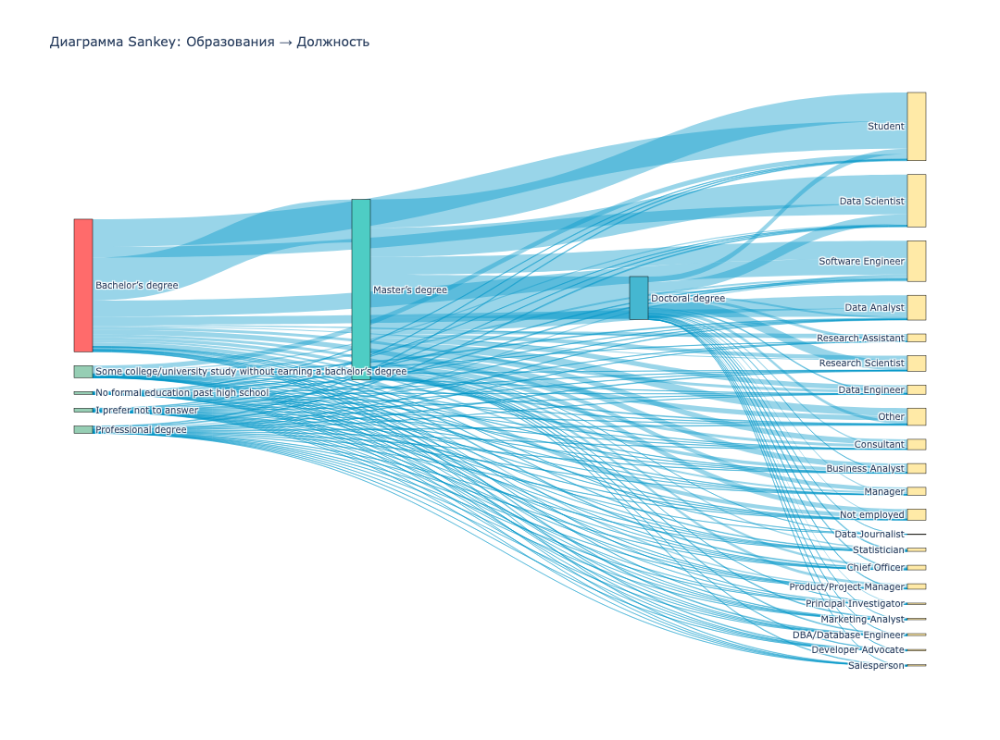

In [26]:
node_to_idx = {node: idx for idx, node in enumerate(labels)}

# Подсчитываем количество связей между узлами
link_counts = df_sankey_expanded.groupby(["source", "target"]).size().reset_index(name="count")

# Создаем списки для source, target и value
source = [node_to_idx[src] for src in link_counts["source"]]
target = [node_to_idx[tgt] for tgt in link_counts["target"]]
value = link_counts["count"].tolist()

# Определяем цвета для разных уровней
def get_node_color(node_label):
    """Возвращает цвет узла в зависимости от его типа"""
    if node_label == "Bachelor’s degree":
        return "#FF6B6B"  # Красный
    elif node_label == "Master’s degree":
        return "#4ECDC4"  # Бирюзовый
    elif node_label == "Doctoral degree":
        return "#45B7D1"  # Синий
    elif node_label in [
        "Some college/university study without earning a bachelor’s degree",
        "Professional degree",
        "I prefer not to answer",
        "No formal education past high school"
    ]:                
        return "#96CEB4"
    else:
        return "#FFEAA7"  # Желтый для должностей (Q6)

# Создаем список цветов для всех узлов
node_colors = [get_node_color(label) for label in labels]

# Создаем диаграмму Sankey
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color="rgba(0, 150, 200, 0.4)"
    )
)])

fig.update_layout(
    title_text="Диаграмма Sankey: Образования → Должность",
    font_size=10,
    height=800
)

fig.show()